In [5]:
from tqdm import tqdm
import wandb
api = wandb.Api(timeout=180)
import os
import pandas as pd
import wandb
import yaml
from pathlib import Path
from copy import deepcopy
import torch
import matplotlib.pyplot as plt
import numpy as np
import argparse
import itertools
import  matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import itertools
import time
import matplotlib as mpl

In [6]:
USER='wilderlavington'
PROJECT='FunctionalStochasticOptimization'
SUMMARY_FILE='sharan_report_0908.csv'
K=1
# make lots dir
try:
    os.makedirs("plots/0908/")
except FileExistsError:
    print("File already exists")

File already exists


In [7]:
def download_wandb_summary(sweeps=['1gj3zreq', 'wbej4buk']):
    """
    Download a summary of all runs on the wandb project
    """
    runs = api.runs(USER+'/'+PROJECT, per_page=10000000)
    summary_list = []
    config_list = []
    name_list = []
    id_list = []
    assert len([run for run in runs])
    for run in tqdm(runs):
        if (sweeps is not None):
            if (run.sweep is not None) and (run.sweep.id in sweeps):
                summary_list.append(run.summary._json_dict)
                run = api.run(USER+'/'+PROJECT+"/"+run.id)
                config_list.append({k: v for k, v in run.config.items()})
                name_list.append(run.name)
                id_list.append(run.id)
        elif sweeps is None:
            summary_list.append(run.summary._json_dict)
            run = api.run(USER+'/'+PROJECT+"/"+run.id)
            config_list.append({k: v for k, v in run.config.items()})
            name_list.append(run.name)
            id_list.append(run.id)
        else:
            pass
    summary_df = pd.DataFrame.from_records(summary_list)
    config_df = pd.DataFrame.from_records(config_list)
    name_df = pd.DataFrame({"name": name_list, "id": id_list})
    all_df = pd.concat([name_df, config_df, summary_df], axis=1)
    Path('logs/wandb_data/').mkdir(parents=True, exist_ok=True)
    all_df.to_csv('logs/wandb_data/'+SUMMARY_FILE)

def download_wandb_records():
    """
    Download data for all runs in summary file
    """
    # load it all in and clean it up
    runs_df = pd.read_csv('logs/wandb_data/'+SUMMARY_FILE, header=0, squeeze=True)
    runs_df = runs_df.loc[:,~runs_df.columns.duplicated()]
    columns_of_interest = ['avg_loss', 'optim_steps', 'grad_norm', 'time_elapsed', \
             'grad_evals', 'function_evals']
    # set which columns we will store for vizualization
    list_of_dataframes = []
    # iterate through all runs to create individual databases
    for ex in tqdm(range(len(runs_df)), leave=False):
        # get the associated runs
        run = api.run(USER+'/'+PROJECT+'/'+runs_df.loc[runs_df.iloc[ex,0],:]['id'])
        run_df = []
        # iterate through all rows in online database
        base_info = {}
        for key in runs_df.loc[runs_df.iloc[ex,0],:].keys():
            base_info.update({key:runs_df.loc[runs_df.iloc[ex,0],:][key]})
        for i, row in run.history().iterrows():
            row_info = deepcopy(base_info)
            row_info.update({key:row[key] for key in columns_of_interest if key in row.keys()})
            run_df.append(row_info)
        # convert format to dataframe and add to our list
        list_of_dataframes.append(pd.DataFrame(run_df))
    # combine and then store
    wandb_records = pd.concat(list_of_dataframes)
    wandb_records.to_csv('logs/wandb_data/__full__'+SUMMARY_FILE)
    # return single data frame for vizualization
    return wandb_records

In [8]:
download_wandb_summary()
wandb_records = download_wandb_records()
# wandb_records = pd.read_csv('logs/wandb_data/__full__'+SUMMARY_FILE, header=0, squeeze=True)

wandb_records

100%|████████████████████████████████████| 16154/16154 [00:32<00:00, 494.10it/s]


,Unnamed: 0,name,id,m,algo,loss,seed,episodes,fullbatch,batch_size,...,inner_backtracks,eta_scale,inner_steps,outer_stepsize,inner_step_size,avg_loss,grad_evals,time_elapsed,function_evals,_wandb
0,8,rural-sweep-26,hfyezy55,10,SGD_FMDOpt,BCEWithLogitsLoss,2,25000,0,1,...,0.0,1.0,81240.0,1.0,0.005040,0.720239,0,3.448672,0,NaN
1,8,rural-sweep-26,hfyezy55,10,SGD_FMDOpt,BCEWithLogitsLoss,2,25000,0,1,...,0.0,1.0,81240.0,1.0,0.005040,0.046558,81240,94.014861,81356,NaN
0,9,snowy-sweep-25,av5cxtk3,10,SGD_FMDOpt,BCEWithLogitsLoss,1,25000,0,1,...,0.0,1.0,162480.0,1.0,0.000740,0.688451,0,3.397033,0,NaN
1,9,snowy-sweep-25,av5cxtk3,10,SGD_FMDOpt,BCEWithLogitsLoss,1,25000,0,1,...,0.0,1.0,162480.0,1.0,0.000740,0.047793,81240,94.714896,81385,NaN
2,9,snowy-sweep-25,av5cxtk3,10,SGD_FMDOpt,BCEWithLogitsLoss,1,25000,0,1,...,0.0,1.0,162480.0,1.0,0.000740,0.033884,162480,186.512484,162680,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
455,93,warm-sweep-1,76aye4er,1,SGD_FMDOpt,MSELoss,1,25000,1,100,...,0.0,1.0,24999.0,1.0,0.006203,0.000001,24521,2206.667062,185888,{'runtime': 2256}
456,93,warm-sweep-1,76aye4er,1,SGD_FMDOpt,MSELoss,1,25000,1,100,...,0.0,1.0,24999.0,1.0,0.006203,0.000001,24649,2218.231202,186858,{'runtime': 2256}
457,93,warm-sweep-1,76aye4er,1,SGD_FMDOpt,MSELoss,1,25000,1,100,...,0.0,1.0,24999.0,1.0,0.006203,0.000001,24807,2232.684848,188055,{'runtime': 2256}
458,93,warm-sweep-1,76aye4er,1,SGD_FMDOpt,MSELoss,1,25000,1,100,...,0.0,1.0,24999.0,1.0,0.006203,0.000001,24821,2233.917388,188161,{'runtime': 2256}


In [9]:
def smooth(array, k):
    array = np.array(array)
    new_array = deepcopy(array)
    # print(array[max(0,i-k):i] )
    for i in range(len(array)):
        if str(array[i]) != 'nan':
            avg_list = [val for val in array[max(0,i-k):i+1] if str(val) != 'nan']
            new_array[i] = sum(avg_list) / len(avg_list)
    return new_array

In [10]:
def format_dataframe(records, id_subfields={}, avg_subfields=['seed'],
            max_subfields=['log_eta', 'eta_schedule', 'c'],
            x_col='optim_steps', y_col='avg_loss'):
    #
    pd.set_option('display.max_columns', None)
    max_subfields = [m for m in max_subfields if m not in id_subfields.keys()]

    for key in id_subfields: 
        records = records.loc[records[key] == id_subfields[key]] 
    records['function_evals+grad_evals'] = records['function_evals']+records['grad_evals']
    if not len(records):
        return None
    # remove nans
    records = records[records[y_col].notna()]
    important_cols = list(set(avg_subfields+max_subfields+\
        list(id_subfields.keys())+[x_col, y_col, 'optim_steps']))
    # remove redundant information
    records = records[important_cols]
    # average over avg_subfields
    records = records.drop(avg_subfields, axis=1)
    # group over averaging field
    gb = list(set(list(max_subfields+list(id_subfields.keys())+[x_col, 'optim_steps'])))
    # only look at final optim steps
    last_mean_records = records.loc[records['optim_steps'] == records['optim_steps'].max()]
    # get the best record
    best_record = last_mean_records[last_mean_records[y_col] == last_mean_records[y_col].min()]
    # find parameters of the best record
    merge_on = list(set(gb)-set(['optim_steps', x_col, y_col]))
    merge_on = [ x for x in merge_on if x in best_record.columns.values]
    best_records = pd.merge(best_record[merge_on], records, on=merge_on,how='left')
    final_records = best_records.groupby(merge_on+[x_col], as_index=False)[y_col].mean()
    final_records[y_col+'25'] = best_records.groupby(merge_on+[x_col], as_index=False)[y_col].quantile(0.25)[y_col]
    final_records[y_col+'75'] = best_records.groupby(merge_on+[x_col], as_index=False)[y_col].quantile(0.75)[y_col]
    final_records = final_records.sort_values(x_col, axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')
    # smooth outputs 
    final_records[y_col+'75'] = smooth(final_records[y_col+'75'],K)
    final_records[y_col+'25'] = smooth(final_records[y_col+'25'],K)
    final_records[y_col] = smooth(final_records[y_col],K) 
#     print(best_record['algo'].unique())
#     print(best_record)
    return final_records

In [11]:
def generate_plot(proc_df, x, y, ax, label, linestyle='solid', color=None, x_max=100000):
    low_order_idx = (torch.tensor(proc_df[x].values) < x_max).nonzero().reshape(-1)
    if label:
        ax.plot(torch.tensor(proc_df[x].values[low_order_idx]), 
                torch.tensor(proc_df[y].values[low_order_idx]), 
                label=label, linestyle=linestyle, color=color,
                linewidth=4)
    else:
        ax.plot(torch.tensor(proc_df[x].values[low_order_idx]), 
                torch.tensor(proc_df[y].values[low_order_idx]), 
                label='_nolegend_', linestyle=linestyle, color=color,
                linewidth=4)
    ax.fill_between(torch.tensor(proc_df[x].values)[low_order_idx],
            torch.tensor(proc_df[y+'75'].values)[low_order_idx],
            torch.tensor(proc_df[y+'25'].values)[low_order_idx],
            alpha = 0.5, label='_nolegend_', linestyle=linestyle, color=color)
    return ax

In [12]:
def generate_A1_figure(loss, dataset_name, wandb_records):
    
    # base info   
    schedules = ['constant', 'stochastic', 'exponential']
    batch_sizes = [5, 25, 125, 625]
    m = [1, 2, 5, 10, 20]
    x = 'optim_steps'
    y = 'grad_norm'
    EPISODES = 25000
    
    # init plots 
    fig, axs = plt.subplots(len(schedules), len(batch_sizes), figsize=(21, 21), sharey=True)
    colors = mpl.cm.Set1.colors   # Qualitative colormap
    colormap = {'SGD':colors[0], 'SLS':colors[1]}
    colormap.update({'FuncOpt'+str(m_):colors[idx+2] for idx, m_ in enumerate(m)})
    algorithms = ['SGD', 'SLS'] + ['FuncOpt'+str(m_) for m_ in m]
    plt.title('Comparison of SGD/SLS/FuncOpt: '+loss+'-'+dataset_name)
    label_map = {'time_elapsed':'Time-Elapsed', 'grad_norm':'Gradient-Norm', 
                'grad_evals': 'Gradient-Evals', 'optim_steps': 'Optimization-Steps', 
                'func_evals': 'Function-Evals'}
    
    # now add in the lines to each of the plots 
    for row, schedule in enumerate(schedules):
        for col, batch_size in enumerate(batch_sizes):
            x_max = 0
            # SLS
            proc_df = format_dataframe(wandb_records,
                id_subfields={'batch_size': batch_size, 
                'use_optimal_stepsize': 1, 'loss': loss, 'algo': 'LSOpt',
                'eta_schedule': schedule, 'dataset_name': dataset_name},
                x_col=x , y_col=y)
            if proc_df is not None:
                x_max = max(proc_df[x].values.max(), x_max)
                axs[row][col] = generate_plot(proc_df, x, y, axs[row][col], label='SLS', 
                                             linestyle='solid', color=colormap['SLS'],
                                             x_max=x_max)
            else:
                print('missing SLS  ', schedule, batch_size)
            
            # SGD
            proc_df = format_dataframe(wandb_records,
                id_subfields={'batch_size': batch_size, 
                'use_optimal_stepsize': 1, 'loss': loss, 'algo': 'SGD',
                'eta_schedule': schedule, 'dataset_name': dataset_name},
                x_col=x , y_col=y)
            if proc_df is not None: 
                x_max = max(proc_df[x].values.max(), x_max)
                axs[row][col] = generate_plot(proc_df, x, y, axs[row][col], label='SGD', 
                                             linestyle='solid', color=colormap['SGD'],
                                             x_max=x_max)
            else:
                print('missing SGD  ', schedule, batch_size)
            
            # FMDopt theoretical 
            for m_ in m:
                # create parsed info 
                proc_df = format_dataframe(wandb_records, 
                    id_subfields={'batch_size': batch_size, 'episodes': EPISODES,
                        'use_optimal_stepsize': 1,  
                        'loss': loss, 'algo': 'SGD_FMDOpt', 'm': m_,
                        'eta_schedule': schedule, 'dataset_name': dataset_name}, 
                         avg_subfields=['seed'], max_subfields=['c'],
                    x_col=x, y_col=y)
                if proc_df is not None:
                    if m_ <=5:
                        x_max = max(proc_df[x].values.max(), x_max)
                    axs[row][col] = generate_plot(proc_df, x, y, axs[row][col],  \
                                        label='FuncOpt'+str(m_), linestyle='solid', color=colormap['FuncOpt'+str(m_)],
                                            x_max=x_max)
                else:
                    print('missing FMDopt  ', m_, schedule, batch_size)
            
            axs[row][col].set_xlim(0, x_max)  
            axs[row][col].grid()    
            axs[row][col].set_title('schedule: '+schedule+', batch_size: '+str(batch_size), fontsize=18)
            axs[row][col].set_xlabel(label_map[x], fontsize=16)
            axs[row][col].set_ylabel(label_map[y], fontsize=16)
            axs[row][col].tick_params(axis='both', which='major', labelsize=14)
            axs[row][col].tick_params(axis='both', which='minor', labelsize=14)
    
    # remaining format stuff  
    handles = [mpatches.Patch(color=colormap[algo], label=algo) for algo in algorithms]
    leg = fig.legend(handles=handles,
           loc="lower center",   # Position of legend
           borderaxespad=1.65,    # Small spacing around legend box
           # title="Algorithms",  # Title for the legend
           fontsize=18,
           ncol=7, 
           bbox_to_anchor=(0.5, -0.05),
           )
    plt.yscale("log")
    plt.subplots_adjust(hspace=1.5)
    plt.rcParams['figure.dpi'] = 400 
    plt.suptitle('Comparison of SGD/SLS/FuncOpt: Loss: '+loss+', Dataset: '+dataset_name, fontsize=28)
    fig.tight_layout()
    fig.subplots_adjust(top=0.95)
    
    # show / save
    plt.savefig('plots/0902/'+loss+'_'+dataset_name+'.pdf', bbox_inches='tight')
    plt.show() 

generating SGD plot for  mushrooms MSELoss
missing SLS   constant 5
missing SGD   constant 5
missing FMDopt   1 constant 5
missing FMDopt   2 constant 5
missing FMDopt   5 constant 5
missing FMDopt   10 constant 5
missing FMDopt   20 constant 5
missing SLS   constant 25
missing SGD   constant 25
missing FMDopt   1 constant 25
missing FMDopt   2 constant 25
missing FMDopt   5 constant 25
missing FMDopt   10 constant 25
missing FMDopt   20 constant 25
missing SLS   constant 125
missing SGD   constant 125
missing FMDopt   1 constant 125
missing FMDopt   2 constant 125
missing FMDopt   5 constant 125
missing FMDopt   10 constant 125
missing FMDopt   20 constant 125
missing SLS   constant 625
missing SGD   constant 625
missing FMDopt   1 constant 625
missing FMDopt   2 constant 625
missing FMDopt   5 constant 625
missing FMDopt   10 constant 625
missing FMDopt   20 constant 625
missing SLS   stochastic 5
missing SGD   stochastic 5
missing FMDopt   1 stochastic 5
missing FMDopt   2 stochasti

/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_10154

missing FMDopt   2 stochastic 25
missing FMDopt   5 stochastic 25
missing FMDopt   10 stochastic 25
missing FMDopt   20 stochastic 25
missing SLS   stochastic 125
missing SGD   stochastic 125
missing FMDopt   1 stochastic 125
missing FMDopt   2 stochastic 125
missing FMDopt   5 stochastic 125
missing FMDopt   10 stochastic 125
missing FMDopt   20 stochastic 125
missing SLS   stochastic 625
missing SGD   stochastic 625
missing FMDopt   1 stochastic 625
missing FMDopt   2 stochastic 625
missing FMDopt   5 stochastic 625
missing FMDopt   10 stochastic 625
missing FMDopt   20 stochastic 625
missing SLS   exponential 5
missing SGD   exponential 5
missing FMDopt   1 exponential 5
missing FMDopt   2 exponential 5
missing FMDopt   5 exponential 5
missing FMDopt   10 exponential 5
missing FMDopt   20 exponential 5
missing SLS   exponential 25
missing SGD   exponential 25
missing FMDopt   1 exponential 25
missing FMDopt   2 exponential 25
missing FMDopt   5 exponential 25
missing FMDopt   10 exp

/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)


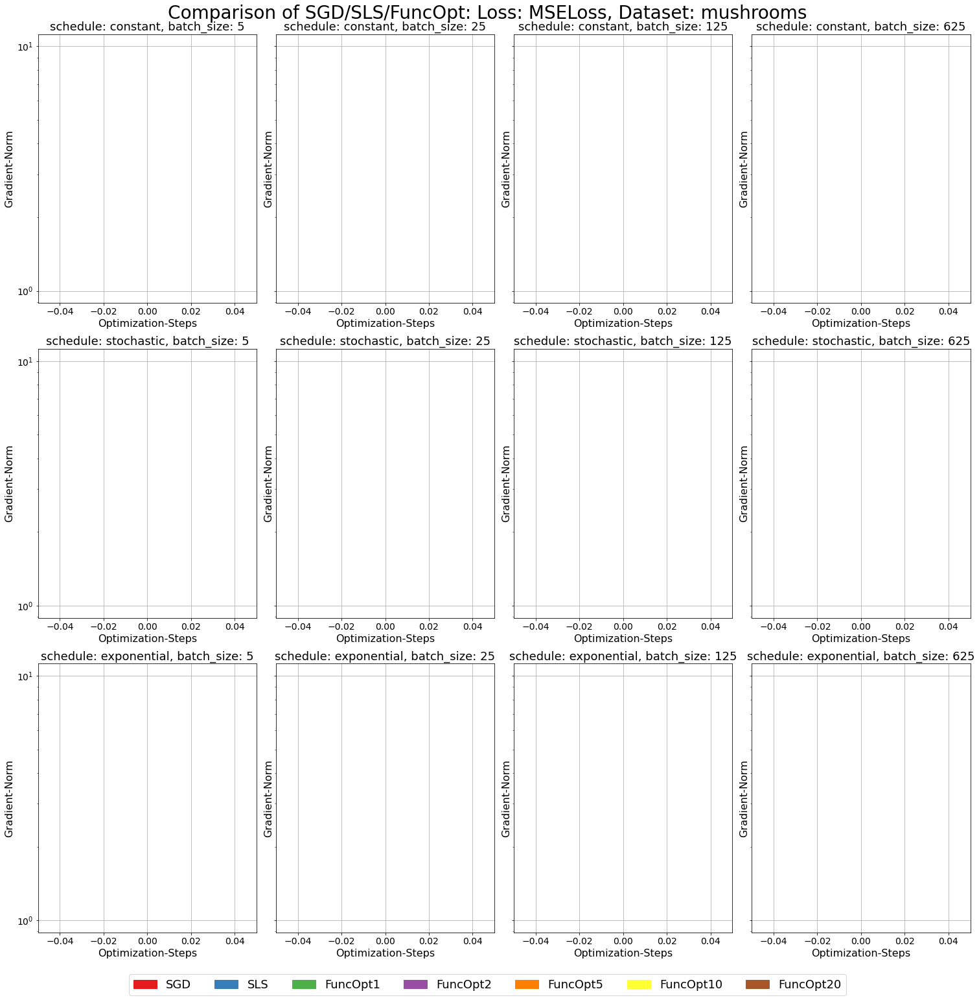

generating SGD plot for  mushrooms BCEWithLogitsLoss
missing SLS   constant 5
missing SGD   constant 5
missing FMDopt   1 constant 5
missing FMDopt   2 constant 5
missing FMDopt   5 constant 5
missing FMDopt   10 constant 5
missing FMDopt   20 constant 5
missing SLS   constant 25
missing SGD   constant 25
missing FMDopt   1 constant 25
missing FMDopt   2 constant 25
missing FMDopt   5 constant 25
missing FMDopt   10 constant 25
missing FMDopt   20 constant 25
missing SLS   constant 125
missing SGD   constant 125
missing FMDopt   1 constant 125
missing FMDopt   2 constant 125
missing FMDopt   5 constant 125
missing FMDopt   10 constant 125
missing FMDopt   20 constant 125
missing SLS   constant 625
missing SGD   constant 625
missing FMDopt   1 constant 625
missing FMDopt   2 constant 625
missing FMDopt   5 constant 625
missing FMDopt   10 constant 625
missing FMDopt   20 constant 625
missing SLS   stochastic 5
missing SGD   stochastic 5
missing FMDopt   1 stochastic 5
missing FMDopt   2

/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_10154

missing FMDopt   2 stochastic 625
missing FMDopt   5 stochastic 625
missing FMDopt   10 stochastic 625
missing FMDopt   20 stochastic 625
missing SLS   exponential 5
missing SGD   exponential 5
missing FMDopt   1 exponential 5
missing FMDopt   2 exponential 5
missing FMDopt   5 exponential 5
missing FMDopt   10 exponential 5
missing FMDopt   20 exponential 5
missing SLS   exponential 25
missing SGD   exponential 25
missing FMDopt   1 exponential 25
missing FMDopt   2 exponential 25
missing FMDopt   5 exponential 25
missing FMDopt   10 exponential 25
missing FMDopt   20 exponential 25
missing SLS   exponential 125
missing SGD   exponential 125
missing FMDopt   1 exponential 125
missing FMDopt   2 exponential 125
missing FMDopt   5 exponential 125
missing FMDopt   10 exponential 125
missing FMDopt   20 exponential 125
missing SLS   exponential 625
missing SGD   exponential 625
missing FMDopt   1 exponential 625
missing FMDopt   2 exponential 625
missing FMDopt   5 exponential 625
missing

/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)


generating SGD plot for  ijcnn MSELoss
missing SLS   constant 5
missing SGD   constant 5
missing FMDopt   1 constant 5
missing FMDopt   2 constant 5
missing FMDopt   5 constant 5
missing FMDopt   10 constant 5
missing FMDopt   20 constant 5
missing SLS   constant 25
missing SGD   constant 25
missing FMDopt   1 constant 25
missing FMDopt   2 constant 25
missing FMDopt   5 constant 25
missing FMDopt   10 constant 25
missing FMDopt   20 constant 25
missing SLS   constant 125
missing SGD   constant 125
missing FMDopt   1 constant 125
missing FMDopt   2 constant 125
missing FMDopt   5 constant 125
missing FMDopt   10 constant 125
missing FMDopt   20 constant 125
missing SLS   constant 625
missing SGD   constant 625
missing FMDopt   1 constant 625
missing FMDopt   2 constant 625
missing FMDopt   5 constant 625
missing FMDopt   10 constant 625
missing FMDopt   20 constant 625
missing SLS   stochastic 5
missing SGD   stochastic 5
missing FMDopt   1 stochastic 5
missing FMDopt   2 stochastic 5


/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_10154

missing SLS   stochastic 125
missing SGD   stochastic 125
missing FMDopt   1 stochastic 125
missing FMDopt   2 stochastic 125
missing FMDopt   5 stochastic 125
missing FMDopt   10 stochastic 125
missing FMDopt   20 stochastic 125
missing SLS   stochastic 625
missing SGD   stochastic 625
missing FMDopt   1 stochastic 625
missing FMDopt   2 stochastic 625
missing FMDopt   5 stochastic 625
missing FMDopt   10 stochastic 625
missing FMDopt   20 stochastic 625
missing SLS   exponential 5
missing SGD   exponential 5
missing FMDopt   1 exponential 5
missing FMDopt   2 exponential 5
missing FMDopt   5 exponential 5
missing FMDopt   10 exponential 5
missing FMDopt   20 exponential 5
missing SLS   exponential 25
missing SGD   exponential 25
missing FMDopt   1 exponential 25
missing FMDopt   2 exponential 25
missing FMDopt   5 exponential 25
missing FMDopt   10 exponential 25
missing FMDopt   20 exponential 25
missing SLS   exponential 125
missing SGD   exponential 125
missing FMDopt   1 exponent

/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)


generating SGD plot for  ijcnn BCEWithLogitsLoss
missing SLS   constant 5
missing SGD   constant 5
missing FMDopt   1 constant 5
missing FMDopt   2 constant 5
missing FMDopt   5 constant 5
missing FMDopt   10 constant 5
missing FMDopt   20 constant 5
missing SLS   constant 25
missing SGD   constant 25
missing FMDopt   1 constant 25
missing FMDopt   2 constant 25
missing FMDopt   5 constant 25
missing FMDopt   10 constant 25
missing FMDopt   20 constant 25
missing SLS   constant 125
missing SGD   constant 125
missing FMDopt   1 constant 125
missing FMDopt   2 constant 125
missing FMDopt   5 constant 125
missing FMDopt   10 constant 125
missing FMDopt   20 constant 125
missing SLS   constant 625
missing SGD   constant 625
missing FMDopt   1 constant 625
missing FMDopt   2 constant 625
missing FMDopt   5 constant 625
missing FMDopt   10 constant 625
missing FMDopt   20 constant 625
missing SLS   stochastic 5
missing SGD   stochastic 5
missing FMDopt   1 stochastic 5
missing FMDopt   2 sto

/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_10154

missing FMDopt   5 exponential 125
missing FMDopt   10 exponential 125
missing FMDopt   20 exponential 125
missing SLS   exponential 625
missing SGD   exponential 625
missing FMDopt   1 exponential 625
missing FMDopt   2 exponential 625
missing FMDopt   5 exponential 625
missing FMDopt   10 exponential 625
missing FMDopt   20 exponential 625


/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)


generating SGD plot for  rcv1 MSELoss
missing SLS   constant 5
missing SGD   constant 5
missing FMDopt   1 constant 5
missing FMDopt   2 constant 5
missing FMDopt   5 constant 5
missing FMDopt   10 constant 5
missing FMDopt   20 constant 5
missing SLS   constant 25
missing SGD   constant 25
missing FMDopt   1 constant 25
missing FMDopt   2 constant 25
missing FMDopt   5 constant 25
missing FMDopt   10 constant 25
missing FMDopt   20 constant 25
missing SLS   constant 125
missing SGD   constant 125
missing FMDopt   1 constant 125
missing FMDopt   2 constant 125
missing FMDopt   5 constant 125
missing FMDopt   10 constant 125
missing FMDopt   20 constant 125
missing SLS   constant 625
missing SGD   constant 625
missing FMDopt   1 constant 625
missing FMDopt   2 constant 625
missing FMDopt   5 constant 625
missing FMDopt   10 constant 625
missing FMDopt   20 constant 625
missing SLS   stochastic 5
missing SGD   stochastic 5
missing FMDopt   1 stochastic 5
missing FMDopt   2 stochastic 5
m

/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_10154

missing FMDopt   1 stochastic 125
missing FMDopt   2 stochastic 125
missing FMDopt   5 stochastic 125
missing FMDopt   10 stochastic 125
missing FMDopt   20 stochastic 125
missing SLS   stochastic 625
missing SGD   stochastic 625
missing FMDopt   1 stochastic 625
missing FMDopt   2 stochastic 625
missing FMDopt   5 stochastic 625
missing FMDopt   10 stochastic 625
missing FMDopt   20 stochastic 625
missing SLS   exponential 5
missing SGD   exponential 5
missing FMDopt   1 exponential 5
missing FMDopt   2 exponential 5
missing FMDopt   5 exponential 5
missing FMDopt   10 exponential 5
missing FMDopt   20 exponential 5
missing SLS   exponential 25
missing SGD   exponential 25
missing FMDopt   1 exponential 25
missing FMDopt   2 exponential 25
missing FMDopt   5 exponential 25
missing FMDopt   10 exponential 25
missing FMDopt   20 exponential 25
missing SLS   exponential 125
missing SGD   exponential 125
missing FMDopt   1 exponential 125
missing FMDopt   2 exponential 125
missing FMDopt 

/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)


generating SGD plot for  rcv1 BCEWithLogitsLoss
missing SLS   constant 5
missing SGD   constant 5
missing FMDopt   1 constant 5
missing FMDopt   2 constant 5
missing FMDopt   5 constant 5
missing FMDopt   10 constant 5
missing FMDopt   20 constant 5
missing SLS   constant 25
missing SGD   constant 25
missing FMDopt   1 constant 25
missing FMDopt   2 constant 25
missing FMDopt   5 constant 25
missing FMDopt   10 constant 25
missing FMDopt   20 constant 25
missing SLS   constant 125
missing SGD   constant 125
missing FMDopt   1 constant 125
missing FMDopt   2 constant 125
missing FMDopt   5 constant 125
missing FMDopt   10 constant 125
missing FMDopt   20 constant 125
missing SLS   constant 625
missing SGD   constant 625
missing FMDopt   1 constant 625
missing FMDopt   2 constant 625
missing FMDopt   5 constant 625
missing FMDopt   10 constant 625
missing FMDopt   20 constant 625
missing SLS   stochastic 5
missing SGD   stochastic 5
missing FMDopt   1 stochastic 5
missing FMDopt   2 stoc

/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_10154

missing FMDopt   20 stochastic 625
missing SLS   exponential 5
missing SGD   exponential 5
missing FMDopt   1 exponential 5
missing FMDopt   2 exponential 5
missing FMDopt   5 exponential 5
missing FMDopt   10 exponential 5
missing FMDopt   20 exponential 5
missing SLS   exponential 25
missing SGD   exponential 25
missing FMDopt   1 exponential 25
missing FMDopt   2 exponential 25
missing FMDopt   5 exponential 25
missing FMDopt   10 exponential 25
missing FMDopt   20 exponential 25
missing SLS   exponential 125
missing SGD   exponential 125
missing FMDopt   1 exponential 125
missing FMDopt   2 exponential 125
missing FMDopt   5 exponential 125
missing FMDopt   10 exponential 125
missing FMDopt   20 exponential 125
missing SLS   exponential 625
missing SGD   exponential 625
missing FMDopt   1 exponential 625
missing FMDopt   2 exponential 625
missing FMDopt   5 exponential 625
missing FMDopt   10 exponential 625
missing FMDopt   20 exponential 625


/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)
/tmp/ipykernel_101541/236181771.py:73: UserWarning: Attempting to set identical left == right == 0 results in singular transformations; automatically expanding.
  axs[row][col].set_xlim(0, x_max)


In [13]:
data_sets = ['mushrooms', 'ijcnn', 'rcv1']
losses = ['MSELoss', 'BCEWithLogitsLoss']
wandb_records = pd.read_csv('logs/wandb_data/__full__'+SUMMARY_FILE, header=0, squeeze=True)
 
for data_set in data_sets:
    for loss in losses:
        print('generating SGD plot for ', data_set, loss)
        generate_A1_figure(loss, data_set, wandb_records) 

In [11]:
def generate_A2_figure(loss, dataset_name, wandb_records):
    
    # base info   
    schedules = ['constant']
    batch_sizes = [5, 25, 125, 625]
    m = [1, 2, 5, 10, 20]
    x = 'optim_steps'
    y = 'grad_norm'
    EPISODES =25000
    
    # init plots 
    fig, axs = plt.subplots(len(schedules), len(batch_sizes), figsize=(21, 7), sharey=True)
    colors = mpl.cm.Set1.colors   # Qualitative colormap
    colormap = {'Adagrad':colors[0]}
    colormap.update({'AdaFuncOpt'+str(m_):colors[idx+2] for idx, m_ in enumerate(m)})
    axs = [axs]
    label_map = {'time_elapsed':'Time-Elapsed', 'grad_norm':'Gradient-Norm', 
                'grad_evals': 'Gradient-Evals', 'optim_steps': 'Optimization-Steps', 
                'func_evals': 'Function-Evals'}
    algorithms = ['Adagrad'] + ['AdaFuncOpt'+str(m_) for m_ in m]
    
    # now add in the lines to each of the plots 
    for row, schedule in enumerate(schedules):
        for col, batch_size in enumerate(batch_sizes):
            x_max = 0
            
            # adagrad
            proc_df = format_dataframe(wandb_records,
                id_subfields={'batch_size': batch_size, 'episodes': EPISODES,
                'use_optimal_stepsize': 1, 'loss': loss, 'algo': 'Sadagrad',
                'eta_schedule': schedule, 'dataset_name': dataset_name},
                x_col=x , y_col=y)
            if proc_df is not None: 
                x_max = max(proc_df[x].values.max(), x_max)
                axs[row][col] = generate_plot(proc_df, x, y, axs[row][col], label='Sadagrad', 
                                             linestyle='solid', color=colormap['Adagrad'])
            else:
                print('missing sadagrad  ', schedule, batch_size)
    
            # AdaFMDopt theoretical 
            for m_ in m:
                # create parsed info 
                proc_df = format_dataframe(wandb_records, 
                    id_subfields={'batch_size': batch_size, 'episodes': EPISODES,
                        'use_optimal_stepsize': 1,
                        'loss': loss, 'algo': 'Ada_FMDOpt', 'm': m_,
                        'eta_schedule': schedule, 'dataset_name': dataset_name}, 
                         avg_subfields=['seed'], max_subfields=['c'],
                        x_col=x, y_col=y)
                
                # generate the associated plot 
                if proc_df is not None:
                    axs[row][col] = generate_plot(proc_df, x, y, axs[row][col],  \
                                            label='AdaFuncOpt', linestyle='solid', color=colormap['AdaFuncOpt'+str(m_)])
                else:
                    print('missing AdaFMDopt  ', schedule, batch_size)
            
            axs[row][col].set_xlim(0, x_max)  
            axs[row][col].grid()    
            axs[row][col].set_title('schedule: '+schedule+', batch_size: '+str(batch_size), fontsize=20)
            axs[row][col].set_xlabel(label_map[x], fontsize=16)
            axs[row][col].set_ylabel(label_map[y], fontsize=16)
            axs[row][col].tick_params(axis='both', which='major', labelsize=14)
            axs[row][col].tick_params(axis='both', which='minor', labelsize=14)
    
    # remaining format stuff 
    handles = [mpatches.Patch(color=colormap[algo], label=algo) for algo in algorithms]
    leg = fig.legend(handles=handles,
           loc="lower center",   # Position of legend
           borderaxespad=1.65,    # Small spacing around legend box
           # title="Algorithms",  # Title for the legend
           fontsize=18,
           ncol=6, 
           bbox_to_anchor=(0.5, -0.15),
           ) 
    plt.yscale("log")
    plt.subplots_adjust(hspace=1.25)
    plt.rcParams['figure.dpi'] = 400 
    plt.suptitle('Comparison of Adagrad/Ada-FuncOpt: Loss: '+loss+', Dataset: '+dataset_name, fontsize=28)
    fig.tight_layout()
    fig.subplots_adjust(top=0.85)
    
    # show / save
    plt.savefig('plots/0902/Adaptive_'+loss+'_'+dataset_name+'.pdf', bbox_inches='tight')
    plt.show() 

generating Adagrad plot for  mushrooms MSELoss


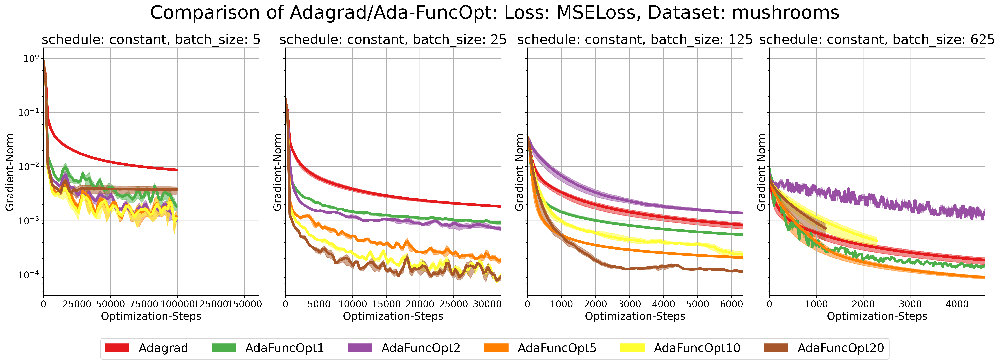

generating Adagrad plot for  mushrooms BCEWithLogitsLoss


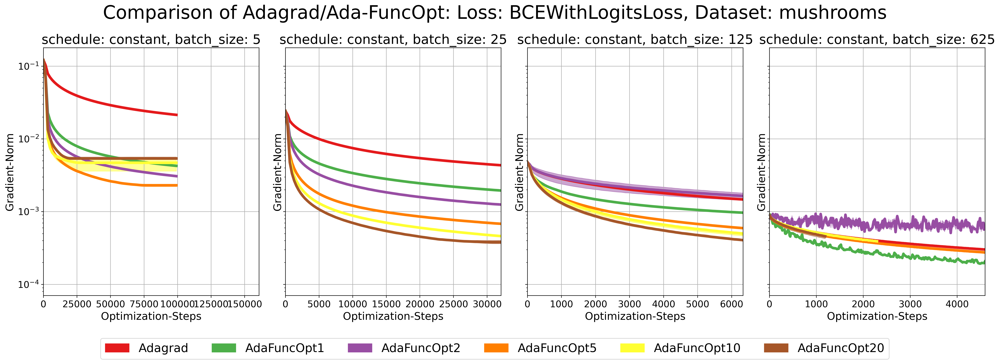

generating Adagrad plot for  ijcnn MSELoss


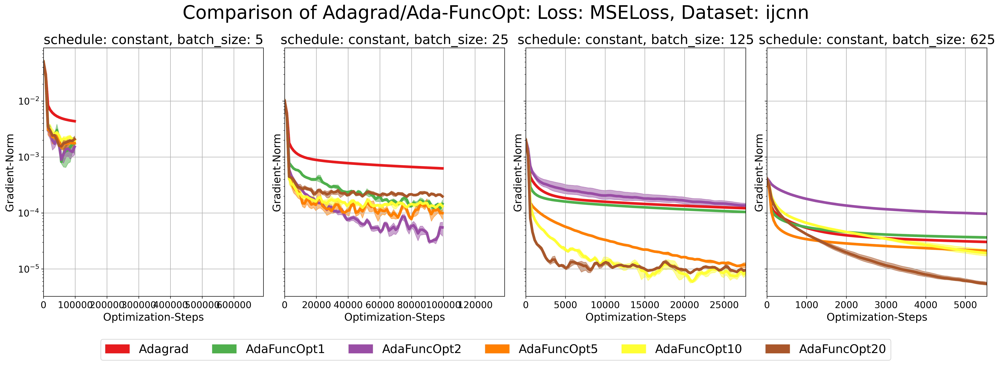

generating Adagrad plot for  ijcnn BCEWithLogitsLoss


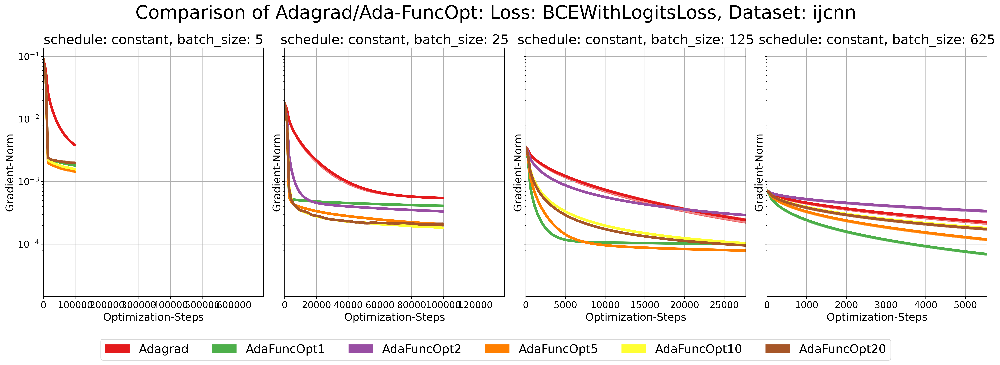

generating Adagrad plot for  rcv1 MSELoss


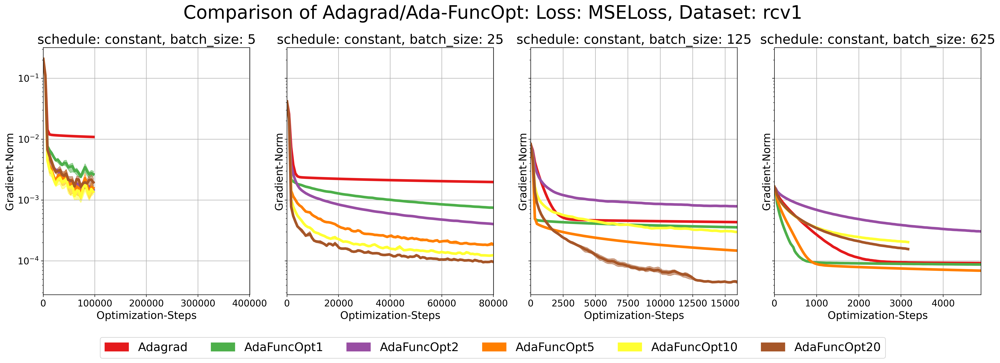

generating Adagrad plot for  rcv1 BCEWithLogitsLoss


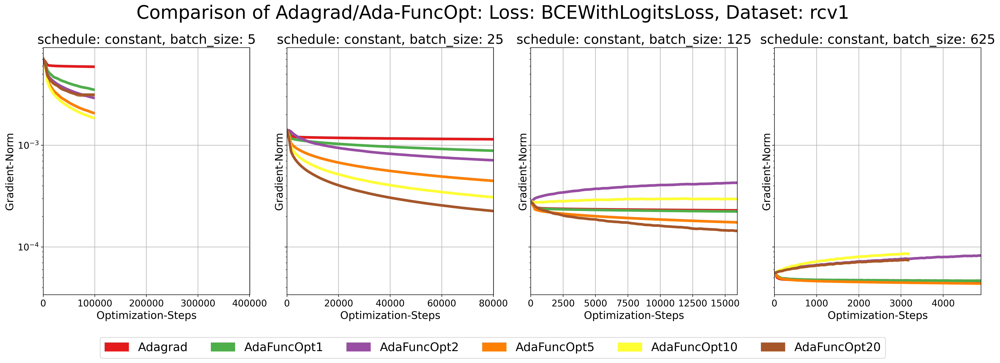

In [12]:
data_sets = ['mushrooms', 'ijcnn', 'rcv1']
losses = ['MSELoss', 'BCEWithLogitsLoss']
wandb_records = pd.read_csv('logs/wandb_data/__full__'+SUMMARY_FILE, header=0, squeeze=True)
 
for data_set in data_sets:
    for loss in losses: 
        print('generating Adagrad plot for ', data_set, loss)
        generate_A2_figure(loss, data_set, wandb_records)